## Import Library needs

In [1]:
#import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import plotly.express as px
import re
from wordcloud import WordCloud
import seaborn as sns
from scipy.stats import chi2_contingency
import plotly.graph_objects as go

### Import Data for Visualization

In [2]:
# read the dataset and store it in a dataframe
file_path = "/Users/makchanna128gmail.com/Documents/GitHub/Job-Vis-2023-2024/Data/Data_clean_new.csv"
dataset = pd.read_csv(file_path)
clean_data = pd.DataFrame(dataset)
clean_data

,No_,Job_position,Company_Name,Experience_level,Experience_Year,Hiring,Salary,Gender,Age,Job_Type,Industry,Job_Categories,Qualification,Language,Location,Publish_Date,Closing_Date
0,1,Assistant Store Manager,Jaspal Fashions,Entry,1,1,Negotiable,Both,18,Full Time,General Business Services,Sales,High School Diploma,English,Phnom Penh,2023-05-23,2023-06-22
1,2,Assistant Store Manager,Jaspal Fashions,Senior,2,1,Negotiable,Both,18,Full Time,Wholesale,Sales,Bachelor's Degree,English,Phnom Penh,2023-05-23,2023-06-22
2,3,Store Manager,Jaspal Fashions,Senior,3,1,Negotiable,Both,18,Full Time,Retail,Sales,Bachelor's Degree,English,Phnom Penh,2023-05-23,2023-06-22
3,4,Store Manager,Jaspal Fashions,Senior,3,1,Negotiable,Both,18,Full Time,Wholesale,Sales,Bachelor's Degree,English,Phnom Penh,2023-05-23,2023-06-22
4,5,Store Supervisor,Jaspal Fashions,Entry,2,1,Negotiable,Both,18,Full Time,Retail,Sales,Bachelor's Degree,English,Phnom Penh,2023-05-23,2023-06-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82907,94622,Service Staff,Premium Care Business Consulting,Entry,1,3,<$200,Both,29,Full Time,General Business Services,Sales,High School Diploma,English,Phnom Penh,2022-12-31,2023-01-03
82908,94623,Digital Marketing,Premium Care Business Consulting,Middle,1,3,$200-$500,Both,31,Full Time,General Business Services,Lawyer,Bachelor's Degree,Chinese,Phnom Penh,2022-12-31,2022-12-31
82909,94624,Sales Manager,Premium Care Business Consulting,Top,3,2,$500-$999,Male,31,Full Time,General Business Services,Legal Service,Bachelor's Degree,Khmer,Phnom Penh,2022-12-31,2023-01-03
82910,94625,Junior Accountant,CMED Construction,Others,1,1,Negotiable,Both,18,Full Time,General Business Services,Technician,Bachelor's Degree,Vietnamese,Phnom Penh,2022-12-31,2023-01-30


In [3]:
# clean_data['Position'] = clean_data['Position'].replace({"UI/UX Designer": "UX/UI Designer", "UX/UI Designer": "UX/UI Designer"})
# clean_data[clean_data['Position']== "UX/UI Designer"]

#### Covert date data type

In [4]:
#Cleaning and Refomating Date of publishing and closing date
# Columns to reformat as datetime:
date_columns = ['Closing_Date']

# Reformat dates in a single line:
for col in date_columns:
    clean_data[col] = pd.to_datetime(clean_data[col], errors='coerce')

In [5]:
#Cleaning and Refomating Date of publishing and closing date
# Columns to reformat as datetime:
date_columns = ['Publish_Date']

# Reformat dates in a single line:
for col in date_columns:
    clean_data[col] = pd.to_datetime(clean_data[col], errors='coerce')
clean_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82912 entries, 0 to 82911
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   No_               82912 non-null  int64         
 1   Job_position      82912 non-null  object        
 2   Company_Name      82912 non-null  object        
 3   Experience_level  82912 non-null  object        
 4   Experience_Year   82912 non-null  int64         
 5   Hiring            82912 non-null  int64         
 6   Salary            82912 non-null  object        
 7   Gender            82912 non-null  object        
 8   Age               82912 non-null  int64         
 9   Job_Type          82912 non-null  object        
 10  Industry          82912 non-null  object        
 11  Job_Categories    82912 non-null  object        
 12  Qualification     82912 non-null  object        
 13  Language          82912 non-null  object        
 14  Location          8291

Checking Slash 

In [6]:
clean_data[clean_data['Job_position']=="/"]


,No_,Job_position,Company_Name,Experience_level,Experience_Year,Hiring,Salary,Gender,Age,Job_Type,Industry,Job_Categories,Qualification,Language,Location,Publish_Date,Closing_Date


## Job Positions analysis

#### Word Cloud Job position

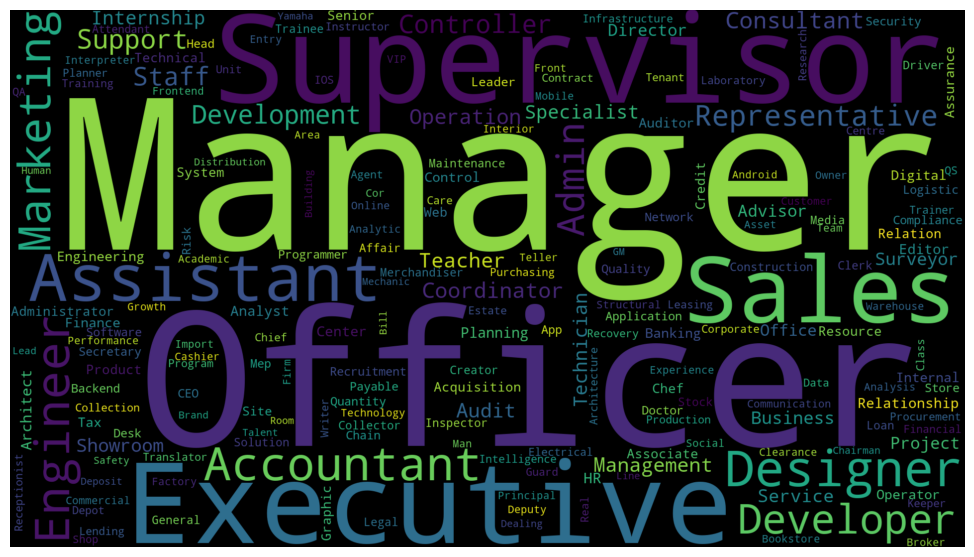

<Figure size 640x480 with 0 Axes>

In [7]:

# Creating the text variable
text = " ".join(cat.split()[1] if len(cat.split()) > 1 else "" for cat in clean_data.Job_position)

# Creating word_cloud with text as argument in .generate() method
word_cloud = WordCloud(width = 1920, height = 1080, collocations=False, background_color='black').generate(text)

# Display the generated Word Cloud
plt.figure(figsize=(10, 6))
plt.imshow(word_cloud, interpolation='bilinear')
plt.tight_layout(pad=0)
plt.axis("off")
plt.show()

plt.savefig('wordcloud.png', facecolor='k', bbox_inches='tight')

#### Top Position Bar Chart

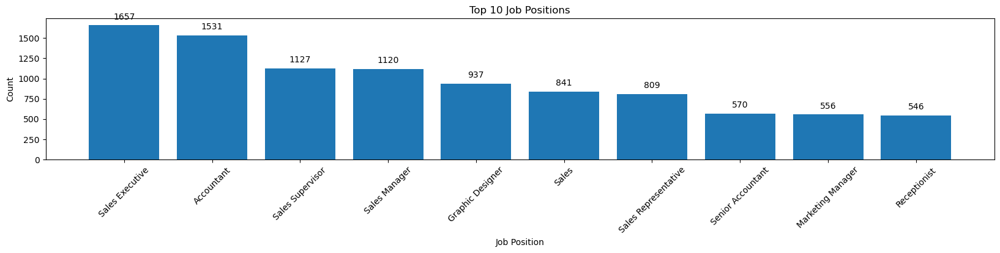

In [8]:
# Assuming you have a DataFrame called 'df' with a column named 'job_position'
top_10_jobs = clean_data['Job_position'].str.replace('/','').value_counts().head(10)

# Create a bar plot
fig, ax = plt.subplots(figsize=(20, 3))
ax.bar(top_10_jobs.index, top_10_jobs.values)
plt.xlabel('Job Position')
plt.ylabel('Count')
plt.title('Top 10 Job Positions')
plt.xticks(rotation=45)

# Display the count on top of each bar
for i, v in enumerate(top_10_jobs):
    ax.text(i, v+50, str(v), ha='center', va='bottom')
plt.show()


In [9]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
top_10_jobs = clean_data['Job_position'].value_counts().head(10)
fig=px.bar(top_10_jobs,x=top_10_jobs.index,
           y=top_10_jobs.values,color=top_10_jobs.index,
           text=top_10_jobs.values,
           labels={'index':'job title','y':'count','text':'count'},
           template='seaborn',title='<b> Top 10 Popular Job Position')
fig.show()

#### Top Industry

In [10]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
top_10_industry = clean_data['Industry'].value_counts().head(10)
fig=px.bar(top_10_industry,x=top_10_industry.index,
           y=top_10_industry.values,color=top_10_industry.index,
           text=top_10_industry.values,
           labels={'index':'Industry','y':'count','text':'count'},
           template='seaborn',title='<b> Top 10 Popular Industry')
fig.show()

#### Top Job_Categories 

In [11]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
top_10_job_Categories = clean_data['Job_Categories'].value_counts().head(10)
fig=px.bar(top_10_job_Categories,x=top_10_job_Categories.index,
           y=top_10_job_Categories.values,color=top_10_job_Categories.index,
           text=top_10_job_Categories.values,
           labels={'index':'Job_Categories','y':'count','text':'count'},
           template='seaborn',title='<b> Top 10 Popular Job_Categories')
fig.show()

#### Position Slash and without slash

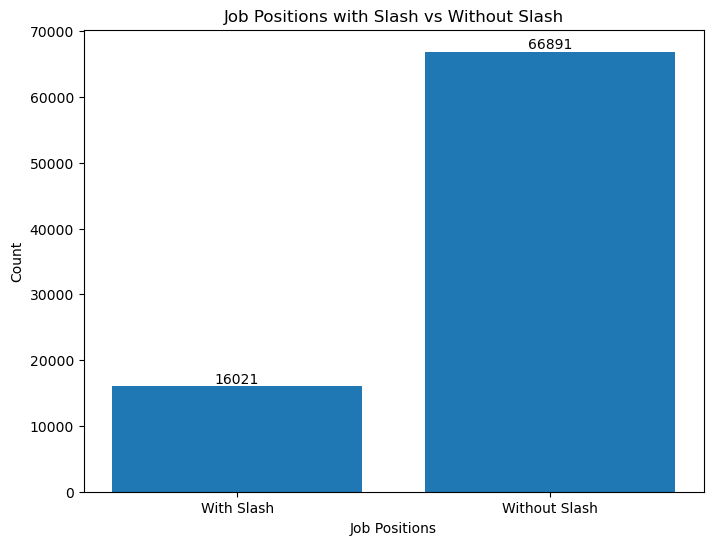

In [12]:


# Assuming you have a DataFrame called 'clean_data' with a column named 'Position'
with_slash = clean_data['Job_position'].str.contains('/').sum()
without_slash = len(clean_data) - with_slash

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(['With Slash', 'Without Slash'], [with_slash, without_slash])
plt.xlabel('Job Positions')
plt.ylabel('Count')
plt.title('Job Positions with Slash vs Without Slash')

# Display the count on top of each bar
for i, v in enumerate([with_slash, without_slash]):
    plt.text(i, v + 50, str(v), ha='center', va='bottom')

plt.show()

In [13]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Position'
job_positions_with_slash = clean_data[clean_data['Job_position'].str.contains('/')]['Job_position'].value_counts()
job_positions_with_slash = pd.DataFrame(job_positions_with_slash)
job_positions_with_slash.shape

(5623, 1)

In [14]:
job_positions_with_slash.head(10).style.background_gradient(cmap='jet')

,count
Job_position,
Marketing Manager / Sales,171
Marketing / Sales,115
Admin / HR,110
UX/UI Designer,101
Executive / Distribution / Sales,94
Admin Manager / HR,93
HR / Admin Officer,92
Admin / Accountant,90
Marketing Executive / Sales,87


In [15]:
clean_data['Industry'].value_counts()

Industry
General Business Services       8008
Banking & Finance               6697
Building                        4299
Automotive  Vehicle             4294
Construction                    4281
                                ... 
Books                             39
Legal Services                    31
Vehicle Repair & Maintenance       7
Civil Services                     3
Packaging                          2
Name: count, Length: 86, dtype: int64

## Company Name analysis

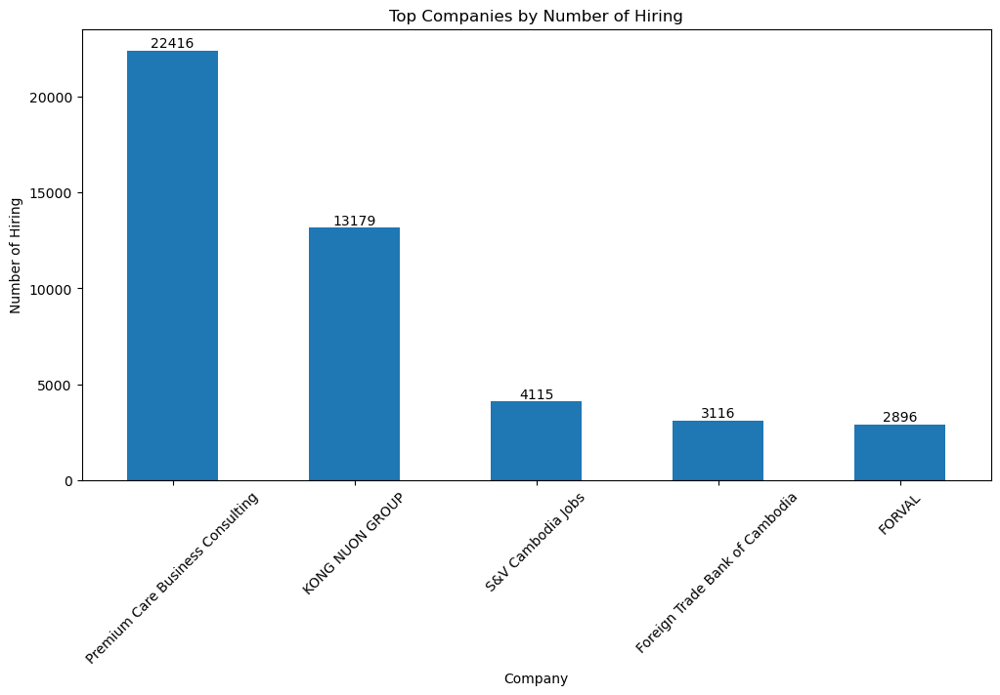

In [16]:

# Assuming you have a DataFrame called 'data_after_drop_column'
# Group the data by company name and calculate the sum of hiring
company_hiring = clean_data.groupby('Company_Name')['Hiring'].sum()

# Sort the group by hiring values in descending order
sorted_company_hiring = company_hiring.sort_values(ascending=False)

# Select the top N companies (e.g., top 10)
top_n = 5
top_companies = sorted_company_hiring.head(top_n)

# Plot the bar chart
plt.figure(figsize=(12, 6))
top_companies.plot(kind='bar')
plt.xlabel('Company')
plt.ylabel('Number of Hiring')
plt.title('Top Companies by Number of Hiring')
plt.xticks(rotation=45)

# Add text annotations on top of each bar
for i, value in enumerate(top_companies.values):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.show()

In [17]:
company_hiring

Company_Name
& Easy                               1
100s Rental Pty                      1
103 ENGINEERING AND CONSTRUCTION    54
103 ENTERPRISE RESOURCE PLANNING     6
103 New Production Group             1
                                    ..
蜀渝火锅餐厅                               7
顶尖科技                                63
香港地產                                43
黄金海岸水疗会所​                            6
龙视传媒 Long TV                         1
Name: Hiring, Length: 2861, dtype: int64

## Salary Analysis

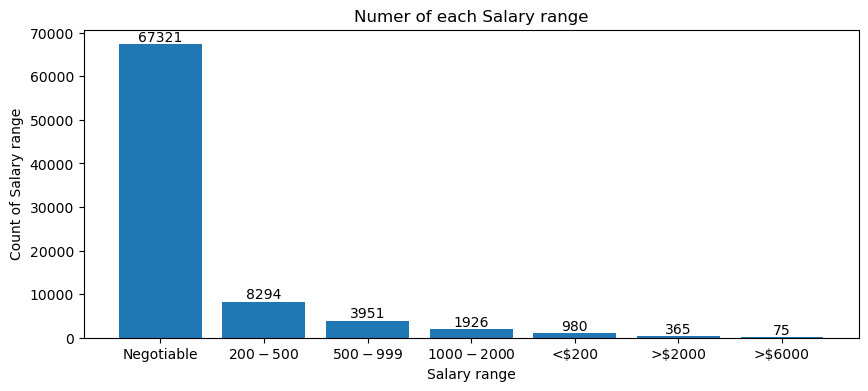

In [18]:
#bar Plot to show about Salary about unique_values and value_counts
# Figure Size
fig = plt.figure(figsize=(10, 4))

# Get value counts and unique values
value_counts = clean_data['Salary'].value_counts()

# Horizontal Bar Plot
plt.bar(value_counts.index, value_counts.values)
plt.xlabel('Salary range')
plt.ylabel('Count of Salary range')
plt.title('Numer of each Salary range')

# Add text annotations on top of each bar
for i, value in enumerate(value_counts.values):
    plt.text(i, value, str(value), ha='center', va='bottom')

# Show Plot
plt.show()


In [19]:

# Creating the histogram
fig = px.histogram(clean_data,x='Salary',marginal='rug',template='seaborn' ,labels={'Salary':'Salary'},title='<b> Salary Distribution', width=800, height=400)
# Display the plot
fig.show()

## Year of Experience Requirements analysis

In [20]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
top_10_years = clean_data['Experience_Year'].value_counts().head(9)
fig=px.bar(top_10_years,x=top_10_years.index,
           y=top_10_years.values,color=top_10_years.index,
       text=top_10_years.values,
           labels={'index':'Experience_Year','y':'count','text':'count'},
           template='seaborn',title='<b> The Most Year of Experience Requirements ')
fig.show()

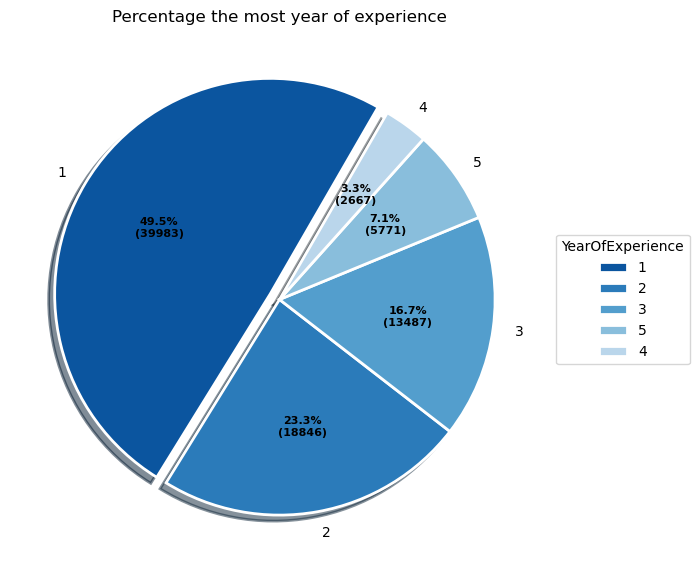

In [21]:
# Assuming you have a DataFrame named 'clean_data' containing the salary data

# Get the top 10 values and their counts
top_10_cars = clean_data['Experience_Year'].value_counts().head(5)

# Creating dataset
cars = top_10_cars.index
data = top_10_cars.values

# Creating explode data
explode = np.zeros(len(cars))
explode[0] = 0.05  # Explode the first slice

# Creating color parameters
colors = 'Blues_r'

# Wedge properties
wp = {'linewidth': 2, 'edgecolor': "white"}

# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100. * np.sum(allvalues))
    return "{:.1f}%\n({:d})".format(pct, absolute)

# Creating plot
fig, ax = plt.subplots(figsize=(10, 7))
wedges, texts, autotexts = ax.pie(data,
                                  autopct=lambda pct: func(pct, data),
                                  explode=explode,
                                  labels=cars,
                                  shadow=True,
                                  colors=sns.color_palette(colors),
                                  startangle=60,
                                  wedgeprops=wp,
                                  textprops=dict(color="black"))

# Adding legend
ax.legend(wedges, cars, title="YearOfExperience", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=8, weight="bold")
ax.set_title("Percentage the most year of experience")

# Show plot
plt.show()

In [22]:

# Assuming you have a DataFrame called 'clean_data' with columns 'Experience_level' and 'Experience_Year'
top_Experience_Year_basedOn_Experience_level = clean_data.groupby([ 'Experience_level','Experience_Year']).size().reset_index(name='count')
top_Experience_Year_basedOn_Experience_level = top_Experience_Year_basedOn_Experience_level.sort_values('count', ascending=False).head(10)

fig = px.bar(top_Experience_Year_basedOn_Experience_level, x='Experience_level', y='Experience_Year',
             color='Experience_Year', text='count',
             labels={'Experience_Year': 'Experience Year', 'count': 'Count'},
             template='seaborn', title='<b> The Most Years of Experience Requirements')

fig.show()

In [23]:
# Create a treemap visualization using Plotly Express
fig = px.treemap(clean_data,
                 path=[px.Constant('Industry'), 'Industry', 'Experience_level'],
                 template='ggplot2',
                 hover_name='Industry',
                 title='<b>TreeMap of Different Job Types in Location with Experience Level')

# Update the color of the root node to 'lightgrey'
fig.update_traces(root_color='lightgrey')

# Display the treemap visualization
fig.show()

In [24]:

top_Experience_Year_basedOn_Experience_level1 = clean_data[['Experience_level', 'Experience_Year','Job_position','Qualification']]
q = top_Experience_Year_basedOn_Experience_level1[top_Experience_Year_basedOn_Experience_level1['Job_position']== 'Cleaner']
q_styled = q.head(10).style.background_gradient(cmap='jet')

q_styled

,Experience_level,Experience_Year,Job_position,Qualification
344,Entry,1,Cleaner,Unlimited
1871,Fresh Graduate,1,Cleaner,High School Diploma
2496,Entry,1,Cleaner,High School Diploma
2930,Entry,1,Cleaner,Unlimited
3774,Entry,1,Cleaner,Unlimited
5458,Entry,1,Cleaner,Unlimited
5472,Entry,1,Cleaner,Unlimited
13002,Middle,1,Cleaner,Unlimited
14319,Entry,1,Cleaner,Unlimited
14490,Entry,1,Cleaner,Unlimited


In [25]:

top_Experience_Year_basedOn_Experience_level1 = clean_data[['Experience_level', 'Experience_Year','Job_position']]
q = top_Experience_Year_basedOn_Experience_level1[top_Experience_Year_basedOn_Experience_level1['Experience_level']== 'Fresh Graduate']
q_styled = q.head(10).style.background_gradient(cmap='jet')

q_styled

,Experience_level,Experience_Year,Job_position
27,Fresh Graduate,1,Infrastructure / ASK Internship
35,Fresh Graduate,1,Inventory / Internship
73,Fresh Graduate,2,Accountant
74,Fresh Graduate,2,Fitness Attendant
77,Fresh Graduate,2,Marketing / Communication Coordinator
78,Fresh Graduate,1,Room Attendant
79,Fresh Graduate,5,Property Manager
82,Fresh Graduate,2,Assistant MD
83,Fresh Graduate,3,Project Drafter
85,Fresh Graduate,1,Front Desk Officer


In [26]:
top_Experience_Year_basedOn_Experience_level1 = clean_data[['Experience_level', 'Experience_Year','Job_position']]
q = top_Experience_Year_basedOn_Experience_level1[(top_Experience_Year_basedOn_Experience_level1['Job_position']== 'Cleaner') &( top_Experience_Year_basedOn_Experience_level1['Experience_level']== 'Others')]
q_styled = q.head(100).style.background_gradient(cmap='jet')

q_styled

,Experience_level,Experience_Year,Job_position
64021,Others,1,Cleaner


In [27]:

# q2 =top_Experience_Year_basedOn_Experience_level1
# q2.style.background_gradient(cmap='jet')



## Experience Level analysis

In [28]:
clean_data['Experience_level'].unique()

array(['Entry', 'Senior', 'Middle', 'Others', 'Top', 'Fresh Graduate'],
      dtype=object)

### Distribution of Experience Level

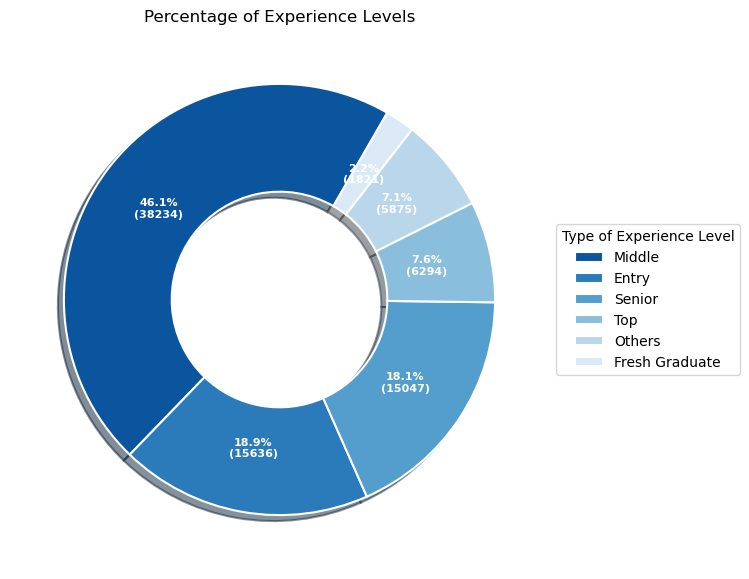

In [29]:
# Assuming you have a DataFrame named 'clean_data' containing the salary data

# Get the top 10 values and their counts
experience_level = clean_data['Experience_level'].value_counts()

# Creating dataset
experience_level_for_plot = experience_level.index

experience_level_for_count = experience_level.values

# Creating explode data
explode = np.zeros(len(experience_level_for_plot))
explode[0] = 0.0  # Explode the first slice

# Creating color parameters
colors = 'Blues_r'

# Wedge properties
wp = {'linewidth': 1.5, 'edgecolor': "white", 'width': 0.5}

# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100. * np.sum(allvalues))
    return "{:.1f}%\n({:d})".format(pct, absolute)

# Creating plot
fig, ax = plt.subplots(figsize=(10, 7))
wedges, texts, autotexts = ax.pie(experience_level_for_count,
                                  autopct=lambda pct: func(pct, experience_level_for_count),
                                  explode=explode,
                                  labels=experience_level_for_plot,
                                  shadow=True,
                                  colors=sns.color_palette(colors),
                                  startangle=60,
                                  pctdistance=0.70,
                                  wedgeprops=wp,
                                  textprops=dict(color="white"))

# Draw a white circle at the center to create the donut shape
center_circle = plt.Circle((5, 5), 0.70, fc='white')
fig.gca().add_artist(center_circle)

# Adding legend
ax.legend(wedges, experience_level_for_plot, title="Type of Experience Level", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=8, weight="bold")
ax.set_title("Percentage of Experience Levels")

# Show plot
plt.show()

### Distribution of Experience Level Across Industry

In [30]:
# Given grouped data
grouped_data = clean_data.groupby('Industry')['Experience_level'].value_counts()

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Filter for the top 10 most numerous categories
top_industries = df.groupby('Industry')['Count'].sum().nlargest(10).index

# Filter the DataFrame for the top 10 industries
top_categories = df[df['Industry'].isin(top_industries)]

# Define a color palette
color_palette = px.colors.qualitative.Plotly                                     

# Plotly Express bar chart with color palette
fig = px.bar(top_categories, x='Industry', y='Count', color='Experience_level',
             labels={'Experience_level': 'Experience Level', 'Count': 'Count'},
             title='Experience Level Counts by Industry (Top 10 Most Numerous)',
             hover_data={'Count': True, 'Experience_level': False},
             barmode='group',
             color_discrete_sequence=color_palette)

fig.update_layout(xaxis={'categoryorder': 'total descending'})

fig.show()

## Job Type analysis

### Number of Job type

In [31]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
jobs_type = clean_data['Job_Type'].value_counts()
fig=px.bar(jobs_type,x=jobs_type.index,
           y=jobs_type.values,color=jobs_type.index,
           text=jobs_type.values,
           labels={'index':'Job Type','y':'count Job Type','text':'count'},
           template='seaborn',title='<b> Number of the Job Type')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=500,  # Set the height of the pie chart
    width=700,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)
fig.show()

### TreeMap of Different Job type in Location with Experience Level

In [32]:
fig=px.treemap(clean_data,
               path=[px.Constant('Job_position'),
                     'Job_Categories','Location',
                     'Experience_level'],
                     template='ggplot2',
                     hover_name='Job_Categories',
                     title='<b>TreeMap of Different Job type in Location with Experience Level')
fig.update_traces(root_color='lightgrey')

## Location analysis

### Top 10 Loaction with highest hiring Job Position

In [33]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
top_10_location = clean_data['Location'].value_counts().head(10)
fig=px.bar(top_10_location,x=top_10_location.index,
           y=top_10_location.values,color=top_10_location.index,
           text=top_10_location.values,
           labels={'index':'Location','y':'count','text':'count'},
           template='seaborn',title='<b> Top 10 Loaction with highest hiring Job Position')
fig.show()

## Distribution of Experience Level Across Job Types

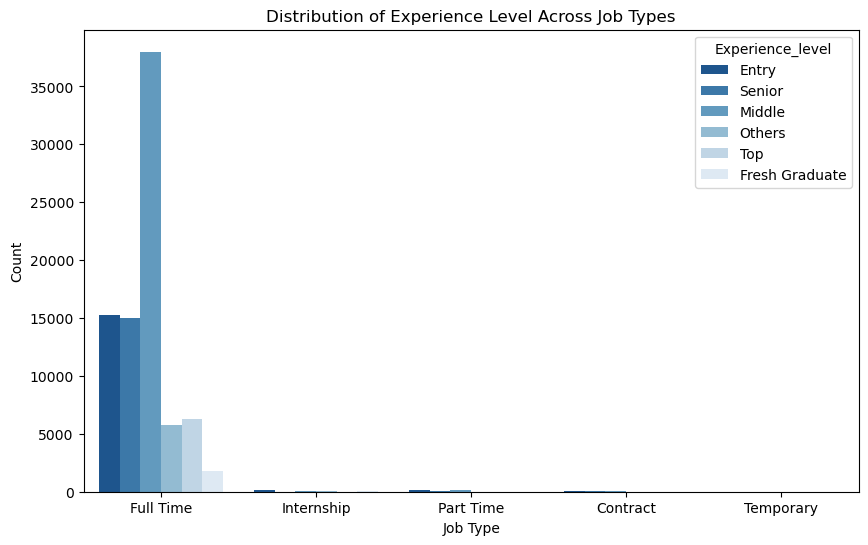

In [34]:
plt.figure(figsize=(10, 6))  
sns.countplot(data=clean_data, x='Job_Type', hue='Experience_level', palette='Blues_r')

plt.title('Distribution of Experience Level Across Job Types')
plt.xlabel('Job Type')
plt.ylabel('Count')

plt.show()

## Gender diversity analysis

In [35]:
# Calculate the count and percentage of each job type
gender_counts = clean_data['Gender'].value_counts().head(10)
total_gender = gender_counts.sum()
gender_percentages = gender_counts / total_gender * 100

# Create a DataFrame with the job type counts and percentages
job_type_data = pd.DataFrame({'Gender': gender_percentages.index, 'Percentage': gender_percentages.values})

# Plot the pie chart with job type percentages
fig = px.pie(job_type_data, names='Gender', values='Percentage', color='Gender',
             hole=0.5, labels={'Gender': 'Gender', 'Percentage': 'Percentage'},
             template='seaborn', title='<b>Total Gender')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=500,  # Set the height of the pie chart
    width=700,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)

# Show the plot
fig.show()

#### Distribution of Gender Across Job Types

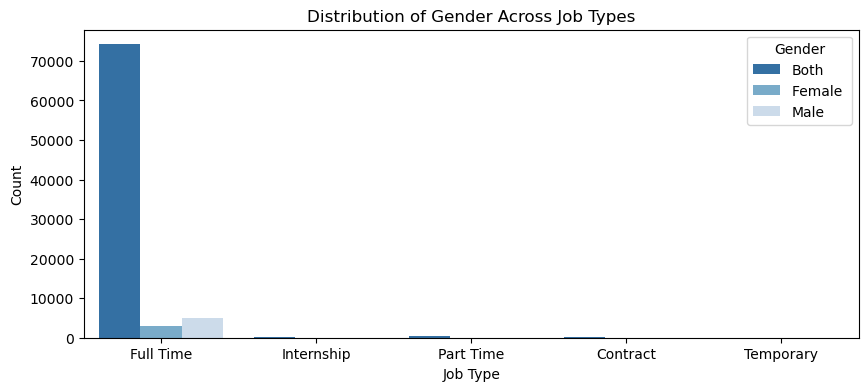

In [36]:
plt.figure(figsize=(10, 4))  
sns.countplot(data=clean_data, x='Job_Type', hue='Gender', palette='Blues_r')

plt.title('Distribution of Gender Across Job Types')
plt.xlabel('Job Type')
plt.ylabel('Count')

plt.show()

#### Distribution of Gender Across Industry

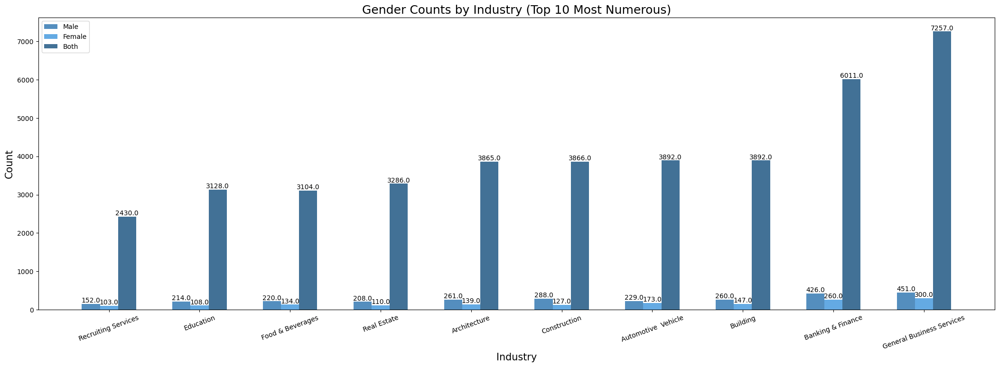

In [37]:
# Given grouped data
grouped_data = clean_data.groupby('Industry')['Gender'].value_counts()

# Get unique industry names
industry_list = grouped_data.index.get_level_values('Industry').unique()

# Initialize empty lists for gender counts
male_counts = np.zeros(len(industry_list))
female_counts = np.zeros(len(industry_list))
both_counts = np.zeros(len(industry_list))

# Iterate over the grouped data and extract gender counts
for (industry, gender), count in grouped_data.items():
    index = np.where(industry_list == industry)[0][0]
    
    if gender == 'Male':
        male_counts[index] = count
    elif gender == 'Female ':
        female_counts[index] = count
    elif gender == 'Both':
        both_counts[index] = count

# Find the indices of the three most numerous categories
most_numerous_indices = np.argsort(both_counts + male_counts + female_counts)[-10:]

plt.figure(figsize=(26, 8))

classes_index = np.arange(len(most_numerous_indices))
width = 0.2

bar1 = plt.bar(classes_index - width, male_counts[most_numerous_indices], width, color='#548EBE', label="Male")
bar2 = plt.bar(classes_index, female_counts[most_numerous_indices], width, color='#64AAE3', label="Female")
bar3 = plt.bar(classes_index + width, both_counts[most_numerous_indices], width, color='#427196', label="Both")

plt.xticks(classes_index, industry_list[most_numerous_indices], rotation=20)
plt.title("Gender Counts by Industry (Top 10 Most Numerous)", fontsize=18)
plt.xlabel("Industry", fontsize=15)
plt.ylabel("Count", fontsize=15)
plt.legend()

# Display number/count values on top of each bar
for rect in bar1 + bar2 + bar3:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width() / 2, height, height,
             ha='center', va='bottom', fontsize=10)

plt.show()

In [38]:
# Given grouped data
grouped_data = clean_data.groupby('Industry')['Gender'].value_counts()

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Filter for the top 10 most numerous categories
top_categories = df.groupby('Industry').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

# Define a color palette
color_palette = px.colors.qualitative.Plotly                                     

# Plotly Express bar chart with color palette
fig = px.bar(top_categories, x='Industry', y='Count', color='Gender',
             labels={'Gender': 'Gender', 'Count': 'Count'},
             title='Gender Counts by Industry (Top 10 Most Numerous)',
             hover_data={'Count': True, 'Gender': False},
             barmode='group',
             color_discrete_sequence=color_palette)

fig.update_layout(xaxis={'categoryorder': 'total descending'})

fig.show()

## Age Analysis

In [47]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
age_type = clean_data['Age'].value_counts().head(10)

total_age = age_type.sum()

# Calculate the percentage of each language
age_percentages = (age_type / total_age) * 100
age_percentages =age_percentages.round(3)

fig=px.bar(age_type,x=age_percentages.index,
           y=age_percentages.values,color=age_percentages.index,
           text=age_percentages.values,
           labels={'index':'Age','y':'Age Percent','Percentage':'Percentage'},
           template='seaborn',title='<b> Percentage of the most Age requirement')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=400,  # Set the height of the pie chart
    width=800,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)
fig.show()

#### Age outlier

In [40]:
# Convert data to a pandas DataFrame
age_outlier = pd.DataFrame(clean_data['Age'])

# Create a box plot using Plotly Express
fig = px.box(age_outlier,template='seaborn',title='<b> Distribution of Age Across Industry',labels={'y':'Age Count'},)

# Customize the plot
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)

# Show the plot
fig.show()

#### Distribution of Age Across Industry

In [41]:
# Convert 'Age' column to numeric data type
clean_data['Age'] = pd.to_numeric(clean_data['Age'], errors='coerce')

# Group the data by 'Industry' and create a box plot for each group
fig = px.box(clean_data, x='Industry', y='Age', template='seaborn', title='<b> Distribution of Age Across Industry',
             labels={'x': 'Industry', 'y': 'Age Count'})

# Customize the plot
fig.update_traces(marker_color='rgb(158, 202, 225)', marker_line_color='rgb(8, 48, 107)',
                  marker_line_width=1.5, opacity=0.6)

# Show the plot
fig.show()

## Qualification Analysis

In [42]:
clean_data['Qualification'].unique()

array(['High School Diploma', "Bachelor's Degree", "Master's Degree",
       'Unlimited', "Associate's Degree", 'Professional Degree',
       'Doctoral Degree'], dtype=object)

In [43]:
# Calculate the count and percentage of each job type
qualification_counts = clean_data['Qualification'].value_counts().head(10)
total_qualification = qualification_counts.sum()
qualification_percentages = qualification_counts / total_qualification * 100

# Create a DataFrame with the job type counts and percentages
job_type_data = pd.DataFrame({'Qualification': qualification_percentages.index, 'Percentage': qualification_percentages.values})

# Plot the pie chart with job type percentages
fig = px.pie(job_type_data, names='Qualification', values='Percentage', color='Qualification',
             hole=0.5, labels={'Qualification': 'Qualification', 'Percentage': 'Percentage'},
             template='seaborn', title='<b>Percentage of Qualification Type')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=500,  # Set the height of the pie chart
    width=700,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)

# Show the plot
fig.show()

## Language Requirements Analysis

In [44]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
language_type = clean_data['Language'].value_counts()

total_count = language_type.sum()

# Calculate the percentage of each language
language_percentages = (language_type / total_count) * 100
language_percentages =language_percentages.round(3)

fig=px.bar(language_type,x=language_percentages.index,
           y=language_percentages.values,color=language_type.index,
           text=language_percentages.values,
           labels={'index':'Language','y':'Language Percent','Percentage':'Percentage'},
           template='seaborn',title='<b> Percentage of the Language Type')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=500,  # Set the height of the pie chart
    width=700,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)
fig.show()

In [45]:
# # Create a sample DataFrame with categorical variables
# data = pd.DataFrame(clean_data)

# # Calculate the Cramér's V statistic between categorical variables
# corr_matrix = pd.DataFrame(index=data.columns, columns=data.columns, dtype=float)
# for col1 in data.columns:
#     for col2 in data.columns:
#         if col1 == col2:
#             corr_matrix.loc[col1, col2] = 1.0
#         else:
#             contingency_table = pd.crosstab(data[col1], data[col2])
#             chi2, _, _, _ = chi2_contingency(contingency_table)
#             n = contingency_table.sum().sum()
#             cramers_v = np.sqrt(chi2 / (n * min(contingency_table.shape) - 1))
#             corr_matrix.loc[col1, col2] = cramers_v

# # Create the correlation heatmap
# plt.figure(figsize=(18, 10))
# sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)

# # Add a title
# plt.title('Correlation Map')

# # Display the plot
# plt.show()

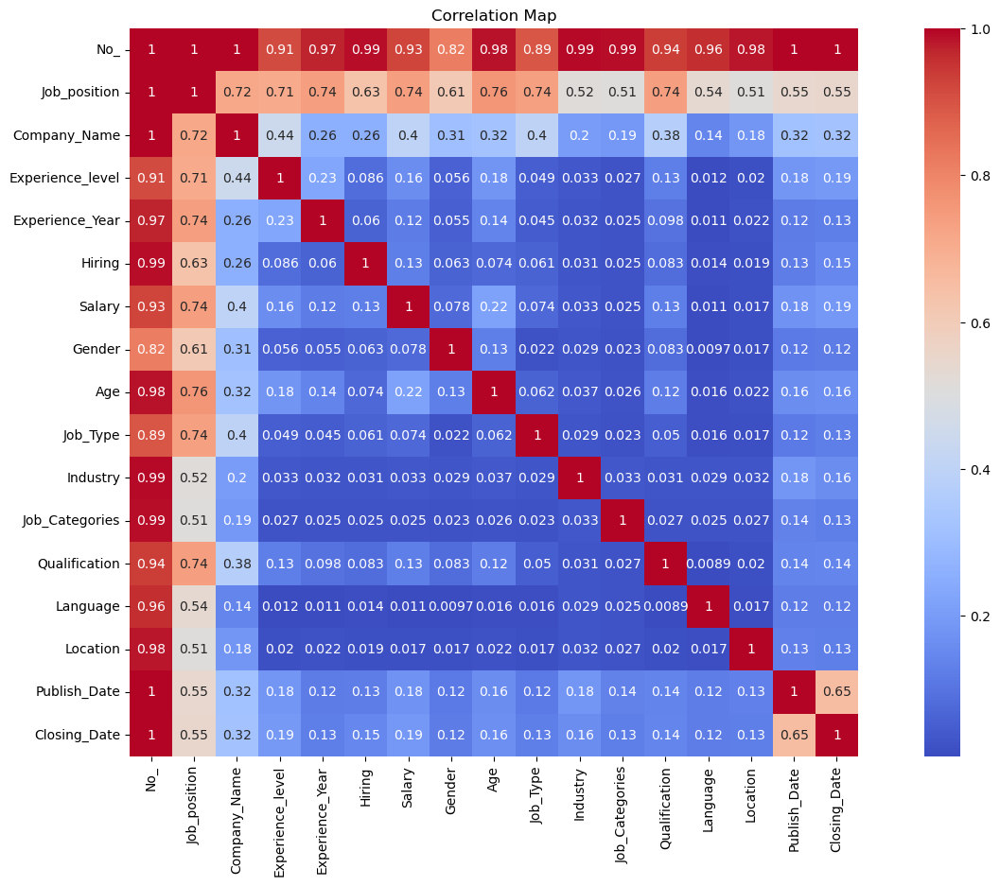